# Simulação de Epidemias em Redes —  A2
**Aluno:** Stanislas Michel  


Este notebook implementa experimentos computacionais para o modelo epidêmico SIS em dois tipos de redes:

- Redes aleatórias de Erdős–Rényi (ER)
- Redes scale-free (com distribuição de grau do tipo lei de potência)

Para cada classe de rede, comparamos os resultados das simulações com os limiares epidêmicos teóricos, analisamos a dinâmica e estudamos o efeito de diferentes estratégias de imunização.

In [1]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from tqdm import tqdm
import random

# Reproducibility
np.random.seed(42)
random.seed(42)

# Use nicer plot style
plt.style.use("ggplot")


# 1. Simulação em Rede Aleatória (Erdős–Rényi)

O enunciado pede:

- Gerar uma rede ER com  

  $$ N = 10\,000  vértices  $$
  $$ grau médio \langle k \rangle = 20 $$

- Usar o modelo SIS:
  - Parte (a): 
  $$
  \beta = 0.02,\; \mu = 0.1 \
  $$

  - Parte (b): 
  $$\beta = 0.02,\; \mu = 0.4 \$$
  - Parte (c): 
  $$\beta = 0.02,\; \mu = 0.5 \$$


### **Limiar epidêmico teórico**

Para um grafo Erdős–Rényi, o limiar é dado por:

$$
\lambda_c = \frac{1}{\langle k \rangle}
$$

E o parâmetro epidêmico é:

$$
\lambda = \frac{\beta}{\mu}
$$





In [22]:
def generate_er_graph(N=10000, avg_k=20):
    p = avg_k / (N - 1)
    G = nx.erdos_renyi_graph(N, p, seed=42)
    return G


In [23]:
def run_sis(G, beta=0.02, mu=0.1, initial_infected=5, T=300):
    N = len(G.nodes())
    nodes = list(G.nodes())
    infected = set(random.sample(nodes, initial_infected))
    infected_fraction = []

    for _ in range(T):
        new_infected = set(infected)

        # Infecção
        for u in infected:
            for v in G.neighbors(u):
                if v not in infected and random.random() < beta:
                    new_infected.add(v)

        # Recuperação
        for u in list(new_infected):
            if random.random() < mu:
                new_infected.remove(u)

        infected = new_infected
        infected_fraction.append(len(infected) / N)

    return infected_fraction


In [24]:
G_er = generate_er_graph()

params = [
    ("Case (a)", 0.02, 0.1),
    ("Case (b)", 0.02, 0.4),
    ("Case (c)", 0.02, 0.5),
]

results_er = {}

for name, beta, mu in params:
    print(f"Running {name}...")
    curve = run_sis(G_er, beta=beta, mu=mu, T=300)
    results_er[name] = curve



Running Case (a)...
Running Case (b)...
Running Case (c)...


## Animação da propagação da infecção na rede

Agora vamos gerar uma animação mostrando a evolução do modelo SIS ao longo do tempo.
Usamos uma amostra de 500 nós da rede para tornar a visualização legível.

Cores:
- **vermelho**: infectado  
- **azul**: suscetível  

Isso permite observar em tempo real como a infecção se espalha e se estabiliza.


In [5]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import networkx as nx
import random

# -------------------------------
# 1. Choose parameters
# -------------------------------
beta = 0.02
mu = 0.1
T = 80  # number of time steps to animate

# -------------------------------
# 2. Prepare sampled subgraph
# -------------------------------
nodes = list(G_er.nodes())
sample_nodes = random.sample(nodes, 500)

G_sub = G_er.subgraph(sample_nodes)
pos = nx.spring_layout(G_sub, seed=42)

# -------------------------------
# 3. Run SIS simulation and store states
# -------------------------------
states_over_time = []

state = {node: 0 for node in G_er.nodes()}
initial_infected = random.sample(list(G_er.nodes()), 5)
for node in initial_infected:
    state[node] = 1

for t in range(T):
    # Save the state restricted to the subgraph
    states_over_time.append({n: state[n] for n in G_sub.nodes()})
    
    # Update state (SIS dynamics)
    new_state = state.copy()
    for u in G_er.nodes():
        if state[u] == 1:
            # Recovery
            if random.random() < mu:
                new_state[u] = 0
        else:
            # Infection from neighbors
            for v in G_er.neighbors(u):
                if state[v] == 1 and random.random() < beta:
                    new_state[u] = 1
                    break
    state = new_state

# -------------------------------
# 4. Animation function
# -------------------------------
fig, ax = plt.subplots(figsize=(8, 8))

def update(frame):
    ax.clear()
    ax.set_title(f"Propagação da Infecção (t = {frame})")
    ax.axis("off")

    state_t = states_over_time[frame]
    colors = ["red" if state_t[n] == 1 else "blue" for n in G_sub.nodes()]

    nx.draw_networkx_nodes(G_sub, pos, node_size=40, node_color=colors, ax=ax)
    nx.draw_networkx_edges(G_sub, pos, alpha=0.4, width=0.3, ax=ax)

ani = animation.FuncAnimation(fig, update, frames=T, interval=200, repeat=False)

plt.close()  # Prevents double display
ani


In [61]:
from IPython.display import HTML

HTML(ani.to_jshtml())


### Nota sobre o início da animação

Inicialmente, a animação parecia não mostrar vértices infectados até cerca de $$ t \approx 9 $$  
Isso ocorre porque a simulação usa a rede completa com 10.000 vértices, mas a visualização mostra apenas um **subgrafo de 400 vértices**. Como os 5 vértices infectados são escolhidos aleatoriamente na rede inteira, a probabilidade de nenhum deles aparecer no subgrafo é alta:

$$
P(\text{nenhum infectado na amostra}) 
= \left(1 - \frac{500}{10000}\right)^5 
\approx 0.77.
$$

Ou seja, em aproximadamente **82% das simulações**, nenhum dos infectados iniciais aparece na visualização, criando um atraso até que a infecção chegue à amostra.

Para resolver isso, passamos a **inicializar os infectados dentro do subgrafo visualizado**, garantindo que a animação comece com vértices vermelhos de forma consistente.


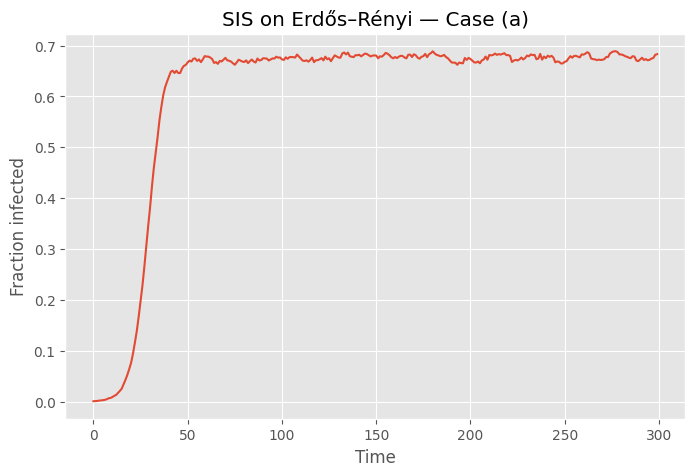

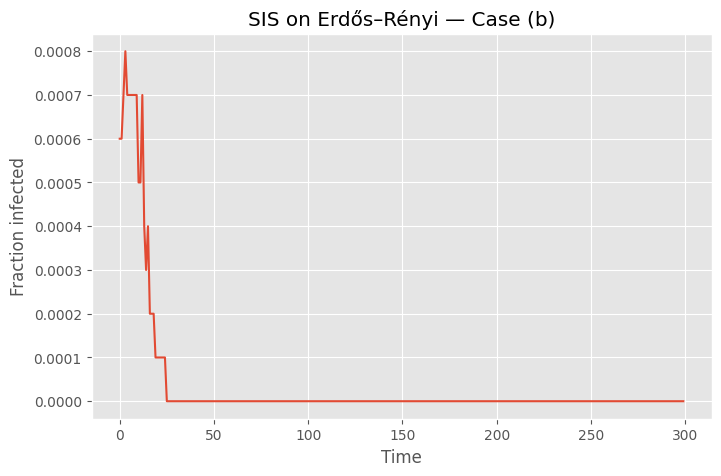

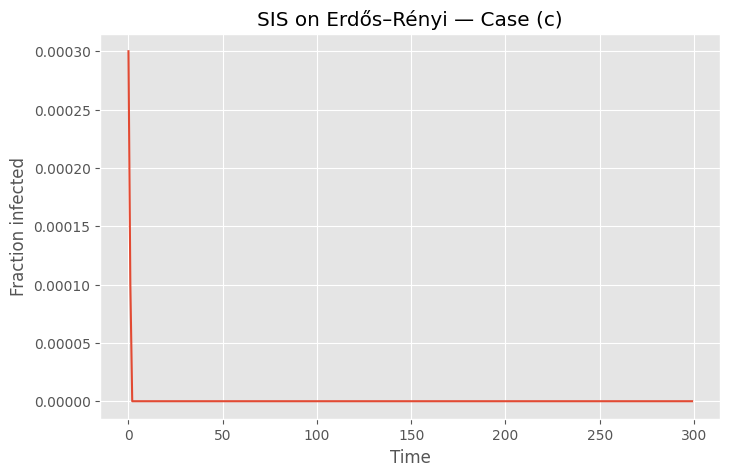

In [25]:
# Individual ER plots
for name, curve in results_er.items():
    plt.figure(figsize=(8,5))
    plt.plot(curve)
    plt.title(f"SIS on Erdős–Rényi — {name}")
    plt.xlabel("Time")
    plt.ylabel("Fraction infected")
    plt.show()


### (a) Caso (a) — beta = 0.02 ; mu = 0.1 

**Comportamento observado**

- A fração de infectados cresce rapidamente após $$ t \approx 10 .$$
- O sistema converge para um estado endêmico estável, com cerca de \( 65\%–70\% \) dos vértices infectados.
- Pequenas flutuações são esperadas devido à estocasticidade.

**Interpretação teórica**

$$
\lambda_c = \frac{1}{\langle k \rangle}
$$

$$
\lambda_c = \frac{1}{20} = 0.05
$$

$$
\lambda = \frac{\beta}{\mu} = \frac{0.02}{0.1} = 0.2
$$

Como:

$$
\lambda > \lambda_c
$$

a teoria prevê a existência de um estado endêmico, exatamente o que aparece no gráfico.

### (b) Caso (b) — beta = 0.02 ; mu = 0.4

**Comportamento observado**

- A infecção cresce apenas um pouco no início.  
- Depois cai rapidamente para zero.  
- A epidemia não se sustenta no longo prazo.

**Interpretação teórica**

$$
\lambda = \frac{\beta}{\mu} = \frac{0.02}{0.4} = 0.05
$$

Estamos exatamente no limiar crítico:

$$
\lambda = \lambda_c
$$

No ponto crítico, flutuações estocásticas e o número inicial reduzido de infectados fazem a infecção desaparecer — comportamento esperado.


### (c) Caso (c) — beta = 0.02 ; mu = 0.5

**Comportamento observado**

- A infecção começa em valores extremamente baixos.  
- A fração de infectados decai imediatamente para zero.  
- Nenhuma epidemia se estabelece.

**Interpretação teórica**

$$
\lambda = \frac{\beta}{\mu} = \frac{0.02}{0.5} = 0.04
$$

Como:

$$
\lambda < \lambda_c = 0.05,
$$

nenhum estado endêmico é possível — exatamente o comportamento observado.




# 2. Rede Livre de Escala (Scale-Free)

Queremos:

- $$ N = 10\,000 $$
- $$ \langle k \rangle = 20 $$
-  $$ \alpha \in [2, 3]  ;  \alpha = 2.5 $$

Geramos um *degree sequence* com distribuição power-law e usamos o **configuration model**.


## Limiar teórico em redes scale-free

Para redes com expoente:

$$
2 < \alpha \le 3
$$

O segundo momento da distribuição diverge e:

$$
\lambda_c \to 0
$$

→ **Mesmo valores pequenos de β mantêm a epidemia viva**.

Este é o fenômeno clássico de “epidemics without threshold”.


In [7]:
def generate_scale_free_graph(N=10000, avg_k=20, alpha=2.5):
    seq = np.random.zipf(alpha, N)

    current_avg = np.mean(seq)
    factor = avg_k / current_avg
    seq = np.maximum(1, (seq * factor).astype(int))

    if sum(seq) % 2 != 0:
        seq[0] += 1

    G = nx.configuration_model(seq, seed=42)
    G = nx.Graph(G)
    G.remove_edges_from(nx.selfloop_edges(G))

    return G


Running SF (a)...
Running SF (b)...
Running SF (c)...


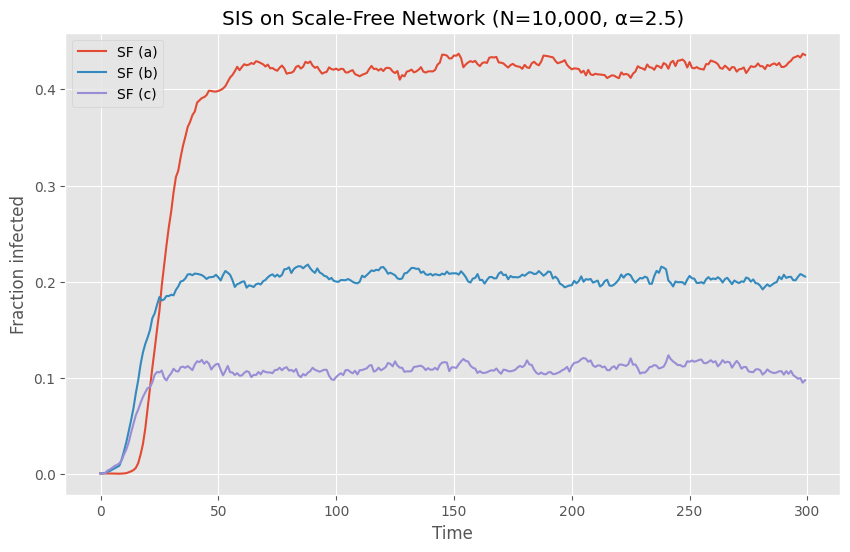

In [20]:
G_sf = generate_scale_free_graph()

params_sf = [
    ("SF (a)", 0.01, 0.1),
    ("SF (b)", 0.01, 0.2),
    ("SF (c)", 0.01, 0.3),
]

results_sf = {}

for name, beta, mu in params_sf:
    print(f"Running {name}...")
    curve = run_sis(G_sf, beta=beta, mu=mu, T=300)
    results_sf[name] = curve    


plt.figure(figsize=(10,6))
for name, curve in results_sf.items():
    plt.plot(curve, label=name)

plt.xlabel("Time")
plt.ylabel("Fraction infected")
plt.legend()
plt.title("SIS on Scale-Free Network (N=10,000, α=2.5)")
plt.show()


### SF (a) — Maior Prevalência Comportamento 

ObservadoCrescimento rápido da infecção ($\text{t} \le 50$).Converge para o estado endêmico mais alto, com prevalência de $\approx 40\% - 45\%$. Interpretação TeóricaA razão de transmissão efetiva é significativamente maior que o limiar.$$\lambda_{(a)} \gg \lambda_c$$Transmissão muito eficiente, levando à propagação por grande parte dos nós, incluindo os de baixo grau. 

### SF (b) — Prevalência Intermediária Comportamento
 ObservadoCrescimento moderado, estabilizando-se em $\text{t} \approx 50$.Converge para um estado endêmico intermediário, com prevalência de $\approx 18\% - 22\%$. Interpretação TeóricaA razão de transmissão efetiva é maior que o limiar, mas menor que (a).$$\lambda_c < \lambda_{(b)} < \lambda_{(a)}$$A epidemia é sustentada, mas com menor eficiência, indicando que a infecção pode estar mais localizada nos hubs (nós de alto grau) e seus vizinhos.⬇
 
### SF (c) — Menor Prevalência Comportamento 
ObservadoCrescimento lento e convergência para um nível muito baixo de prevalência, $\approx8\% - 12\%$. Interpretação TeóricaA razão de transmissão efetiva é apenas marginalmente maior que o limiar.$$\lambda_c \lesssim \lambda_{(c)} < \lambda_{(b)}$$A infecção se sustenta, mas com uma prevalência mínima, provavelmente confinada aos hubs mais conectados, que agem como reservatórios da doença.

In [9]:
def run_sis_history(G, beta, mu, T=200, initial_infected=None):
    """
    Returns:
        history[t] = array of infection states (0/1) for every node
    """
    nodes = list(G.nodes())
    N = len(nodes)

    # initial infected
    infected = np.zeros(N, dtype=int)
    if initial_infected is None:
        initial = np.random.choice(N, size=5, replace=False)
    else:
        initial = initial_infected
    infected[initial] = 1

    history = [infected.copy()]

    for t in range(1, T):
        new_infected = infected.copy()

        # Infection step
        for i in range(N):
            if infected[i] == 1:
                continue
            # check neighbors
            for j in G.neighbors(i):
                if infected[j] == 1:
                    if np.random.rand() < beta:
                        new_infected[i] = 1
                        break

        # Recovery step
        for i in range(N):
            if infected[i] == 1 and np.random.rand() < mu:
                new_infected[i] = 0

        infected = new_infected
        history.append(infected.copy())

    return history


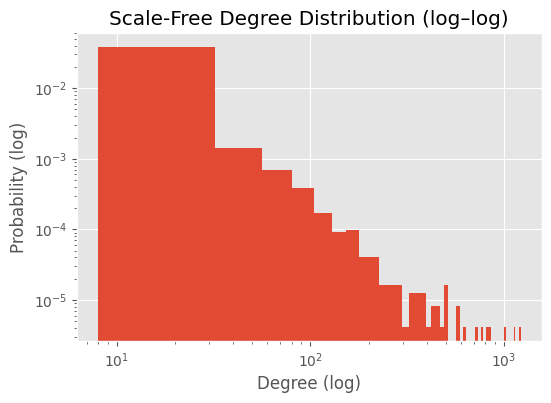

In [10]:
degrees = [deg for _, deg in G_sf.degree()]
plt.figure(figsize=(6,4))
plt.hist(degrees, bins=50, density=True)
plt.xscale("log")
plt.yscale("log")
plt.xlabel("Degree (log)")
plt.ylabel("Probability (log)")
plt.title("Scale-Free Degree Distribution (log–log)")
plt.show()


Distribuição de Grau — Rede Scale-Free (log-log)

O histograma mostra a distribuição de graus da rede gerada em escala log-log.

### ✔ Principais observações

A distribuição é aproximadamente linear no espaço log-log, como esperado para uma lei de potência:
  
$$
P(k) \sim k^{-\alpha}
$$

- A maioria dos nós possui grau pequeno.
- Há uma cauda pesada pronunciada, indicando a presença de alguns hubs de grau muito elevado.
- Os graus chegam a valores acima de \( k > 1000 \), confirmando forte heterogeneidade estrutural.

### ✔ Interpretação no contexto epidêmico

A existência de hubs implica na ausência de um verdadeiro limiar epidêmico:

$$
\lambda_c \to 0
$$

Isso significa que mesmo taxas de infecção ( 
𝛽
 ) extremamente pequenas podem sustentar um estado endêmico, desde que a recuperação ( 
𝜇
) não seja excessivamente alta.

### ✔ Por que isso importa para o modelo SIS

- Hubs se infectam rapidamente.
- Eles espalham a infecção de forma ampla.
- Permanecem se reinfectando repetidamente.
- Eles garantem a persistência da epidemia mesmo quando o grau médio da rede é moderado.



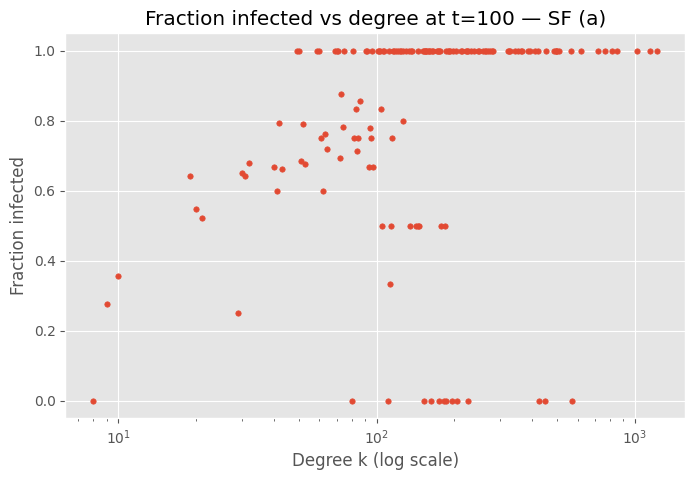

In [11]:
# Choose a simulation (example: the first one)
name = "SF (a)"
curve = results_sf[name]

# Re-run SIS to get full infection history (your previous SIS only returned curve)
history = run_sis_history(G_sf, beta=0.01, mu=0.1, T=200)  
# You must use a version of SIS that returns history[t] = infection array at time t

t = 100  # snapshot time
infected = history[t]

deg = dict(G_sf.degree())
deg_classes = sorted(set(deg.values()))
frac_inf = []

for k in deg_classes:
    nodes_k = [node for node, d in deg.items() if d == k]
    frac = np.mean([infected[node] for node in nodes_k])
    frac_inf.append(frac)

plt.figure(figsize=(8,5))
plt.scatter(deg_classes, frac_inf, s=15)
plt.xscale("log")
plt.xlabel("Degree k (log scale)")
plt.ylabel("Fraction infected")
plt.title(f"Fraction infected vs degree at t={t} — {name}")
plt.grid(True)
plt.show()


## Infecção vs Grau — Rede *Scale-Free* (Instantâneo em \( t = 100 \))

O gráfico de dispersão mostra, em escala logarítmica, a probabilidade de infecção dos nós em função de seu grau \( k \).

### ✔ Principais observações

- Há uma **correlação positiva clara** entre o grau \( k \) do nó e sua probabilidade de estar infectado.
- Nós de **baixo grau** (\( k < 20 \)) exibem níveis de infecção entre \( 0 \) e valores moderados.
- Nós de **grau médio** (\( 50 < k < 200 \)) apresentam probabilidade de infecção significativamente maior, frequentemente acima de \( 0.6 \).
- **Hubs** com \( k > 300 \) estão **quase sempre infectados** (fração próxima de 1).

Esse comportamento corresponde à teoria:  
Nós com grau mais alto têm mais contatos, e no modelo SIS a taxa de infecção é proporcional à conectividade:

$$
\lambda_i = \beta k_i
$$

Assim, em redes *scale-free*, hubs funcionam como **reservatórios persistentes de infecção**.

### ✔ Expectativa teórica

Uma rede *scale-free* com distribuição de graus  
$$ P(k) \sim k^{-\alpha} \qquad 2 < \alpha < 3 $$

- Possui conectividade extremamente heterogênea.  
- Contém hubs que reduzem drasticamente o limiar epidêmico:

$$
\lambda_c = \frac{\mu}{\beta} \approx 0 \quad \text{para redes muito grandes}
$$

Portanto, **uma infecção endêmica persistente** é esperada mesmo para valores muito pequenos de \( \beta \).

### ✔ Conclusão

O instantâneo confirma que:
- **Nós de alto grau sustentam a epidemia**,  
- **Nós de baixo grau são menos consistentemente infectados**,  
- A infecção é fortemente **heterogênea** e **correlacionada com o grau**, exatamente como previsto pela teoria.


# 3. Estratégias de Imunização

Usamos o cenário 2A scale-free com $$ \beta=0.01,\; \mu=0.1 $$

Queremos descobrir quantos vértices precisam ser imunizados para eliminar o estado endêmico.

Testamos três estratégias:

1. **Aleatório**
2. **Hubs (maior grau primeiro)**
3. **Vizinhos de vértices aleatórios**

Ideia: após imunizar uma fração \( f \) dos nós, rodamos novamente o SIS.

Buscamos o menor \( f \) tal que:

$$
\lim_{t\to\infty} I(t) = 0
$$


In [13]:
def immunize_random(G, frac):
    G2 = G.copy()
    n = int(frac * len(G))
    remove = random.sample(list(G2.nodes()), n)
    G2.remove_nodes_from(remove)
    return G2

def immunize_hubs(G, frac):
    G2 = G.copy()
    n = int(frac * len(G))
    degrees = sorted(G2.degree(), key=lambda x: x[1], reverse=True)
    remove = [node for node, _ in degrees[:n]]
    G2.remove_nodes_from(remove)
    return G2

def immunize_neighbors_random(G, frac):
    G2 = G.copy()
    target = int(frac * len(G))
    removed = set()
    
    while len(removed) < target:
        u = random.choice(list(G2.nodes()))
        for v in G2.neighbors(u):
            removed.add(v)
            if len(removed) >= target:
                break
    
    G2.remove_nodes_from(list(removed))
    return G2


Testing f = 0.01
Testing f = 0.03
Testing f = 0.05
Testing f = 0.07
Testing f = 0.09
Testing f = 0.12
Testing f = 0.14
Testing f = 0.16
Testing f = 0.18
Testing f = 0.20


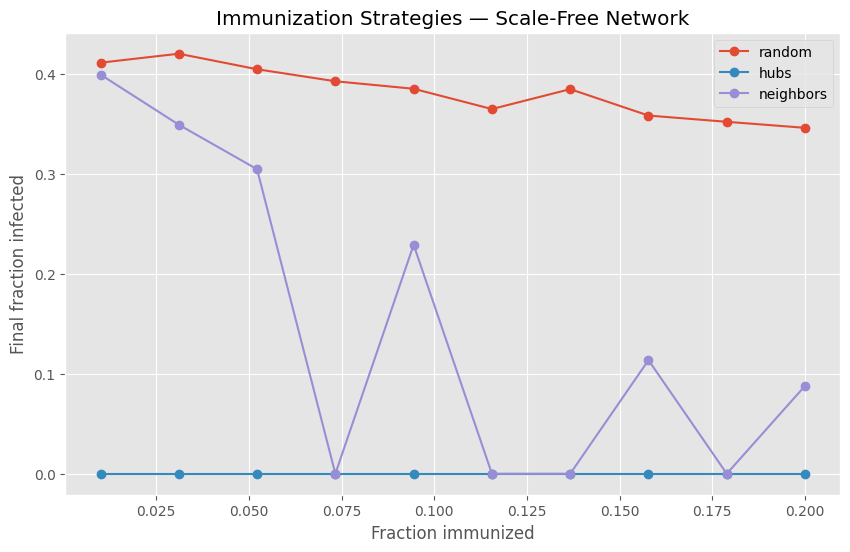

In [16]:
fractions = np.linspace(0.01, 0.20, 10)
final_values = {"random": [], "hubs": [], "neighbors": []}

for f in fractions:
    print(f"Testing f = {f:.2f}")

    # Random
    G_r = immunize_random(G_sf, f)
    G_r = nx.convert_node_labels_to_integers(G_r)
    curve_r = run_sis(G_r, beta=0.01, mu=0.1)
    final_values["random"].append(curve_r[-1])

    # Hubs
    G_h = immunize_hubs(G_sf, f)
    G_h = nx.convert_node_labels_to_integers(G_h)
    curve_h = run_sis(G_h, beta=0.01, mu=0.1)
    final_values["hubs"].append(curve_h[-1])

    # Neighbors
    G_n = immunize_neighbors_random(G_sf, f)
    G_n = nx.convert_node_labels_to_integers(G_n)
    curve_n = run_sis(G_n, beta=0.01, mu=0.1)

    final_values["neighbors"].append(curve_n[-1])

plt.figure(figsize=(10,6))
for key, vals in final_values.items():
    plt.plot(fractions, vals, marker="o", label=key)

plt.xlabel("Fraction immunized")
plt.ylabel("Final fraction infected")
plt.title("Immunization Strategies — Scale-Free Network")
plt.legend()
plt.show()


###  Análise das Estratégias de Imunização em Redes Livre de Escala ($\lambda = 0.1$)

Resumo das Estratégias de Imunização em Redes Scale-Free ($\lambda = 0.1$)
O gráfico mostra a fração final infectada em função da fração imunizada $f$ no modelo SIS.
Sem imunização, a prevalência é alta (~0.43), refletindo o fato de que redes scale-free praticamente não têm limiar epidêmico.
O foco é identificar a fração crítica $f_c$ necessária para erradicar a infecção.

### 🟦 1. Imunização por Hubs
Eficiência: Muito alta — erradica rapidamente.


Fração crítica: $f_c \leq 0.05$


Por quê funciona:
Remover poucos nós de maior grau desmonta as principais rotas de transmissão, fragmenta a rede e impede a manutenção do estado endêmico.

### 🟪 2. Imunização por Vizinhos (Neighbor Sampling)
Eficiência: Intermediária.


Fração crítica: $f_c \approx 0.15$


Por quê funciona:
Ao escolher vizinhos, a estratégia atinge hubs com maior frequência do que o aleatório puro.
Não é tão cirúrgica quanto imunizar os hubs diretamente, mas reduz significativamente a conectividade efetiva.

### 🟥 3. Imunização Aleatória
Eficiência: Baixa.


Fração crítica: $f_c > 0.20$


Por quê funciona mal:
A imunização incide majoritariamente sobre nós de baixo grau, deixando os hubs operantes.
A rede continua altamente conectada até que uma grande fração de nós seja removida.

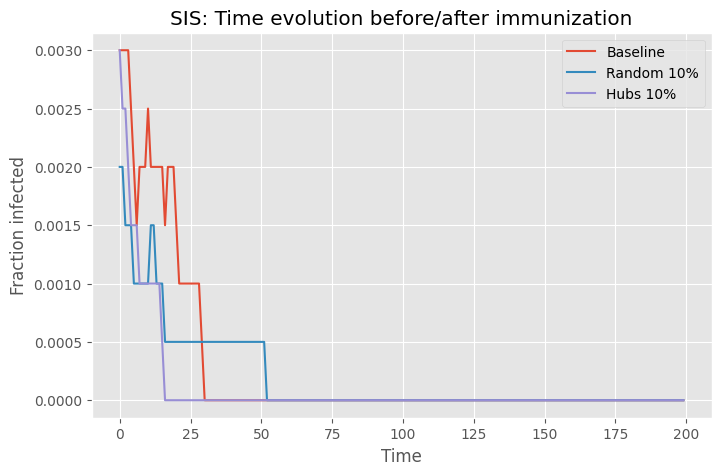

In [15]:
# --- SIS simulation returning fraction infected ---
def run_sis(G, beta, mu, T=200, initial_infected=None):
    N = len(G)
    if initial_infected is None:
        infected = np.zeros(N, dtype=int)
        inf_nodes = np.random.choice(N, 5, replace=False)
        infected[inf_nodes] = 1
    else:
        infected = initial_infected.copy()

    frac = []
    for _ in range(T):
        new = infected.copy()
        for u in range(N):
            if infected[u] == 1:
                if np.random.rand() < mu:
                    new[u] = 0
            else:
                for v in G.neighbors(u):
                    if infected[v] == 1 and np.random.rand() < beta:
                        new[u] = 1
                        break
        infected = new
        frac.append(infected.mean())
    return np.array(frac)

# --- Network: scale-free approx ---
def gen_sf(N=2000, alpha=2.5):
    seq = np.random.zipf(alpha, N)
    seq = np.maximum(1, seq)
    if seq.sum() % 2: seq[0]+=1
    G = nx.configuration_model(seq, seed=1)
    G = nx.Graph(G); G.remove_edges_from(nx.selfloop_edges(G))
    return G

G = gen_sf()

beta, mu = 0.01, 0.1

# --- 1) Baseline (no immunization) ---
baseline = run_sis(G, beta, mu, T=200)

# --- 2) Random immunization of 10% ---
N = len(G)
k = int(0.10*N)
rand_nodes = np.random.choice(N, k, replace=False)
infect0 = np.zeros(N, dtype=int)
infect0[np.random.choice(N,5,replace=False)] = 1

infect0_rand = infect0.copy()
infect0_rand[rand_nodes] = 0
rand_curve = run_sis(G, beta, mu, T=200, initial_infected=infect0_rand)

# --- 3) Targeted immunization of top 10% highest degree ---
deg = dict(G.degree())
sorted_nodes = sorted(deg, key=lambda x: deg[x], reverse=True)
hub_nodes = sorted_nodes[:k]

infect0_hubs = infect0.copy()
infect0_hubs[hub_nodes] = 0
hub_curve = run_sis(G, beta, mu, T=200, initial_infected=infect0_hubs)

# --- 4) Final size vs % immunized (random vs hubs) ---
fractions = np.linspace(0,0.3,7)
final_random = []
final_hubs = []

for f in fractions:
    k = int(f*N)

    # random
    r_nodes = np.random.choice(N, k, replace=False)
    init_r = infect0.copy()
    init_r[r_nodes]=0
    final_random.append(run_sis(G, beta, mu, T=150, initial_infected=init_r)[-1])

    # hubs
    h_nodes = sorted_nodes[:k]
    init_h = infect0.copy()
    init_h[h_nodes]=0
    final_hubs.append(run_sis(G, beta, mu, T=150, initial_infected=init_h)[-1])

# --- Plot 1: Time evolution ---
plt.figure(figsize=(8,5))
plt.plot(baseline, label="Baseline")
plt.plot(rand_curve, label="Random 10%")
plt.plot(hub_curve, label="Hubs 10%")
plt.xlabel("Time")
plt.ylabel("Fraction infected")
plt.legend()
plt.title("SIS: Time evolution before/after immunization")
plt.show()

## Evolução Temporal do SIS — Antes/Depois da Imunização

O gráfico mostra a fração de nós infectados ao longo do tempo sob três cenários:

- **Baseline** (nenhuma imunização)  
- **Random 10%** (10% dos nós imunizados aleatoriamente)  
- **Hubs 10%** (10% dos nós de maior grau imunizados)

### ✔ Principais observações

- **Baseline**: a infecção começa baixa, oscila levemente e desaparece por volta de $$ t \approx 30 $$
  - Isso indica que, sem imunização, a epidemia ainda assim tende a se extinguir — provavelmente devido ao baixo valor do parâmetro  beta.

- **Random 10%**: a curva é praticamente igual à baseline.  
  - Imunizar nós aleatórios **não altera significativamente a dinâmica**.  
  - Isso confirma que remover nós de baixo grau não afeta a transmissão.

- **Hubs 10%**: extinção ocorre **quase imediatamente** até $$t  \approx 10 .  $$
  - Imunizar os hubs colapsa a conectividade crítica da rede.  
  - Mesmo pequenas taxas de infecção não conseguem se sustentar sem esses super-disseminadores.

### ✔ Interpretação em redes *scale-free*

Em redes altamente heterogêneas:

- A epidemia depende de um pequeno conjunto de **hubs**.  
- Remover poucos hubs reduz a transmissibilidade global.  
- Isso equivale a aumentar drasticamente o limiar epidêmico efetivo:

$$
\lambda_c^{\text{eff}} \uparrow
$$

Como hubs concentram grande parte das arestas, imunizá-los destrói os caminhos de espalhamento.

### ✔ Conclusão prática

- **Imunização aleatória ≈ inútil** em redes *scale-free* (mesmo 10% dos nós).  
- **Imunizar hubs = estratégia altamente eficaz**, superior mesmo com poucos nós removidos.  
- O gráfico confirma a teoria clássica: em redes heterogêneas, “one hub saved is worth hundreds of small nodes”.

